In [1]:
A = [3 -1.0; -1.0 4]
b = [-1, 2.0]
xsoln = A\b

2-element Array{Float64,1}:
 -0.1818181818181818
  0.4545454545454546

In [2]:
##
# A quadratic function is
# f(x) = 1/2 x'*A*x - x'*b
# We will show, miniminzing f(x) <=> solving Ax = b when A is symm. pos. def.
# sym. pos. def <=> x'*A*x > 0
quadratic(A,b,x) = 0.5*x'*A*x - x'*b
@show quadratic(A,b,xsoln)
@show quadratic(A,b,randn(2))

quadratic(A, b, xsoln) = -0.5454545454545455
quadratic(A, b, randn(2)) = 1.8757404209828552


1.8757404209828552

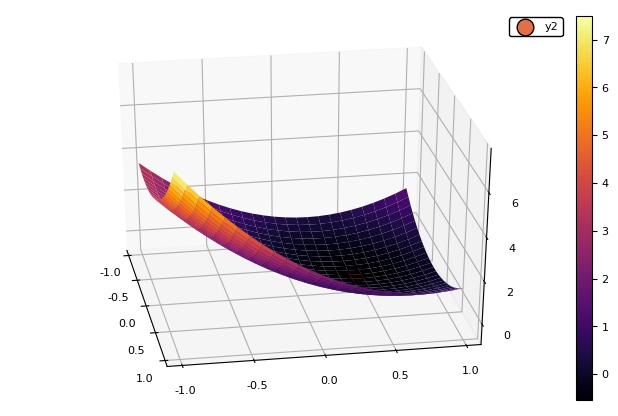

/usr/local/lib/python2.7/dist-packages/matplotlib/figure.py:457: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


In [3]:
##
using Plots
pyplot()
x = y = range(-1, stop = 1, length = 25)
plot(x,y,(x,y) -> quadratic(A,b,[x,y]), st=:surface,camera=(80,30))
scatter!([xsoln[1]],[xsoln[2]], [quadratic(A, b, xsoln)], markersize = 12)
gui()

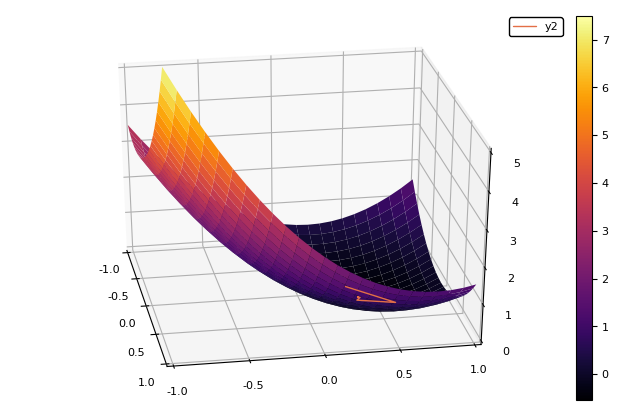

In [4]:
## Let's use the optimal alpha
using Plots
pyplot()

x = y = range(-1, stop = 1, length = 25)
x0 = randn(2)
p = plot(x,y,(x,y) -> quadratic(A,b,[x,y]), st=:surface,camera=(80,30), xlim=(-1,1), ylim=(-1,1), zlim=(0,5))
plot!([x0[1]], [x0[2]], [quadratic(A,b,x0)])


x = copy(x0)
for i=1:15
  g = A*x - b
  α = g'*g / (g'*A*g)
  x .+= -α*g
  push!(p[1][2], x[1],x[2], quadratic(A,b,x))
  gui()
  sleep(0.25)
end

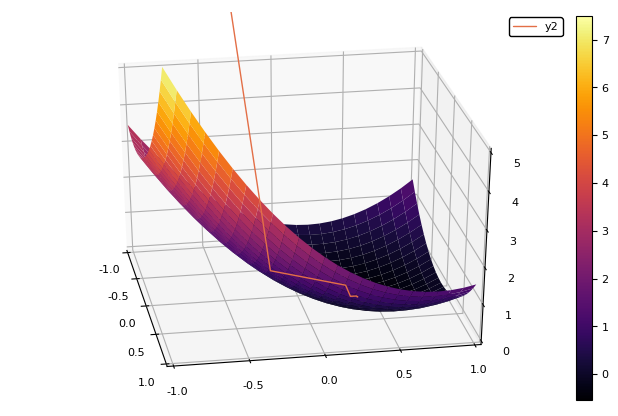

In [5]:
##
using Plots
pyplot()

x = y = range(-1, stop = 1, length = 25)
x0 = randn(2)
p = plot(x,y,(x,y) -> quadratic(A,b,[x,y]), st=:surface,camera=(80,30), xlim=(-1,1), ylim=(-1,1), zlim=(0,5))
plot!([x0[1]], [x0[2]], [quadratic(A,b,x0)])

x = copy(x0)
n = 2
for j=1:10
  i = mod(j,n)+1
  r = A*x - b
  x[i] += -r[i]/A[i,i]
  push!(p[1][2], x[1],x[2], quadratic(A,b,x))
  gui()
  sleep(0.25)
end